In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
from sklearn import datasets
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.model_selection import train_test_split, cross_val_score

import matplotlib.pyplot as plt
pd.set_option('display.max_columns', None)

%matplotlib inline

In [2]:
data = pd.read_csv('../Data/SDSS-Gaia_5950stars.csv')

variables = data.columns
#print(variables.values)

#Ceck data with info function
data.info()

<class 'pandas.DataFrame'>
RangeIndex: 5950 entries, 0 to 5949
Data columns (total 21 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Unnamed: 0  5950 non-null   int64  
 1   J           5950 non-null   float64
 2   H           5950 non-null   float64
 3   K           5950 non-null   float64
 4   C_FE        5950 non-null   float64
 5   N_FE        5950 non-null   float64
 6   O_FE        5950 non-null   float64
 7   NA_FE       5950 non-null   float64
 8   MG_FE       5950 non-null   float64
 9   AL_FE       5950 non-null   float64
 10  SI_FE       5950 non-null   float64
 11  CA_FE       5950 non-null   float64
 12  S_FE        5950 non-null   float64
 13  V_FE        5950 non-null   float64
 14  CR_FE       5950 non-null   float64
 15  FE_H        5950 non-null   float64
 16  CO_FE       5950 non-null   float64
 17  NI_FE       5950 non-null   float64
 18  E           5950 non-null   float64
 19  Energy      5950 non-null   float64
 2

In [3]:
# Search for missing, NA and null values)


(data.isnull() | data.empty | data.isna()).sum()

Unnamed: 0    0
J             0
H             0
K             0
C_FE          0
N_FE          0
O_FE          0
NA_FE         0
MG_FE         0
AL_FE         0
SI_FE         0
CA_FE         0
S_FE          0
V_FE          0
CR_FE         0
FE_H          0
CO_FE         0
NI_FE         0
E             0
Energy        0
Lz            0
dtype: int64

In [4]:
#Let's see the frequency of the variable target.
#Convert variable to categorical.
#data.target=data.target.astype('int64').astype('category')

# #Frequency.
# freq=data['target'].value_counts()

# freq

In [5]:
# #Let's check graphically.
# freq.plot(kind='bar')

In [6]:
#Let's show a summary of teh dataset where we can see 
# the basic statistic data.
data.describe()

,Unnamed: 0,J,H,K,C_FE,N_FE,O_FE,NA_FE,MG_FE,AL_FE,SI_FE,CA_FE,S_FE,V_FE,CR_FE,FE_H,CO_FE,NI_FE,E,Energy,Lz
count,5950.000000,5950.000000,5950.000000,5950.000000,5950.000000,5950.000000,5950.000000,5950.000000,5950.000000,5950.000000,5950.000000,5950.000000,5950.000000,5950.000000,5950.000000,5950.000000,5950.000000,5950.000000,5950.000000,5.950000e+03,5950.000000
mean,2974.500000,13.219591,12.428854,12.259380,-0.386822,0.114119,0.110790,-0.240976,0.052198,-0.340543,0.042219,0.085231,0.337204,-0.301125,-0.082950,-0.898266,-0.134241,-0.086796,0.606305,2.768855e+04,1588.618178
std,1717.761382,1.118370,1.079531,1.074965,0.150228,0.154497,0.117848,0.335777,0.096379,0.134582,0.095937,0.080585,0.278054,0.335958,0.230567,0.302236,0.207264,0.061567,0.198746,6.245751e+04,3295.330251
min,0.000000,7.591000,7.020000,6.829000,-1.372410,-0.543190,-0.306517,-1.538618,-0.605297,-0.961619,-0.479329,-0.625435,-0.758588,-1.503878,-1.326386,-2.331600,-1.891070,-0.601608,0.155381,-7.659914e+04,-11838.454259
25%,1487.250000,12.936500,12.184250,12.032250,-0.476735,0.045771,0.043675,-0.423003,-0.009059,-0.427487,-0.019590,0.044614,0.195717,-0.431583,-0.137166,-1.114375,-0.190268,-0.118502,0.475099,-3.478183e+03,-3.937413
50%,2974.500000,13.543500,12.690000,12.495000,-0.381955,0.102560,0.081680,-0.262528,0.052816,-0.332989,0.022264,0.074684,0.355522,-0.268968,-0.028171,-0.853280,-0.106765,-0.086343,0.576072,3.048469e+04,767.934104
75%,4461.750000,13.878000,13.073000,12.896000,-0.294512,0.166320,0.131061,-0.093920,0.106106,-0.251329,0.093811,0.113097,0.512682,-0.172078,0.039397,-0.654355,-0.038723,-0.055652,0.741758,5.158869e+04,2654.567084
max,5949.000000,15.729000,14.906000,14.591000,0.685960,1.964300,0.746943,1.828622,0.450873,0.954681,0.663941,0.690905,0.975732,1.476700,1.144034,-0.126650,1.281750,1.493013,0.996933,3.569381e+06,168809.594081


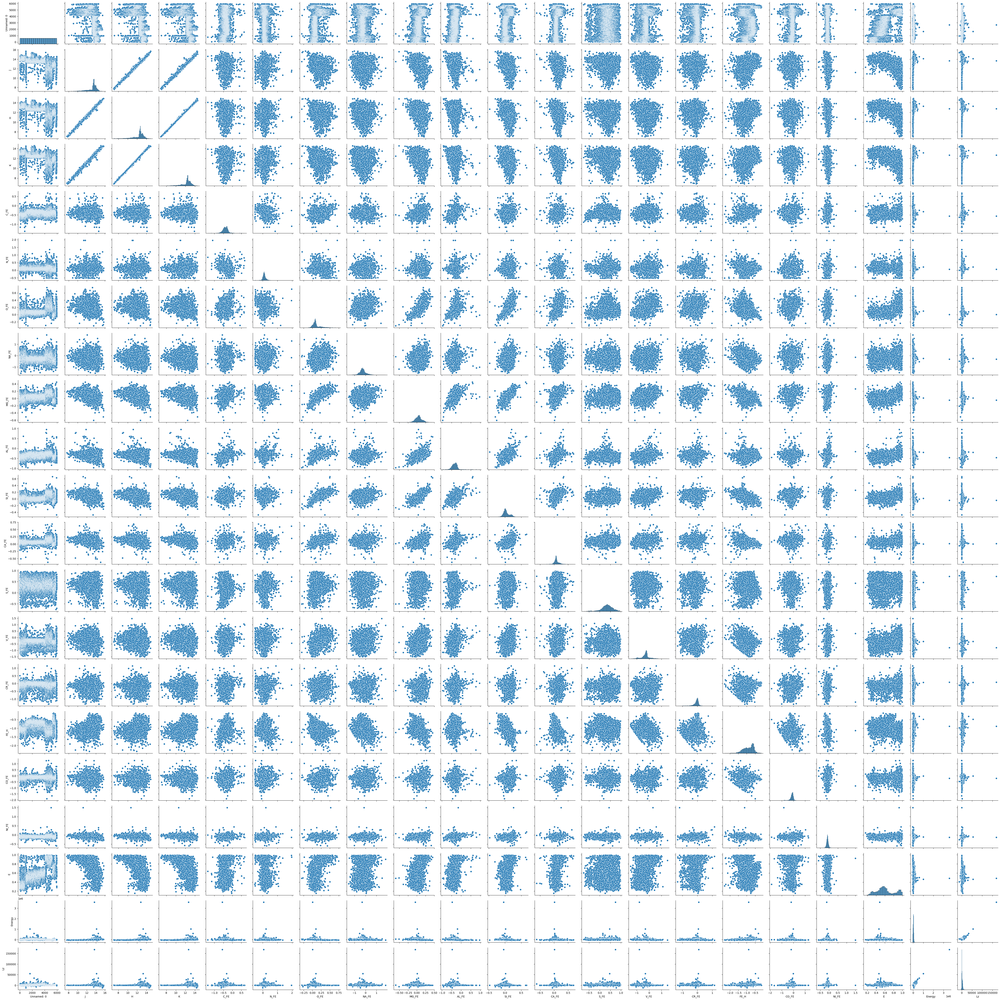

In [7]:
#scatter plots
sns.pairplot(data)

In [8]:
from sklearn.preprocessing import quantile_transform
# data_X = data.drop(['target'], axis=1) #We are not going to use the target for unsupervised learning
X = quantile_transform(data, copy=True)

from sklearn.decomposition import PCA
pca = PCA(n_components=2)
X_new = pca.fit_transform(X)

df_X = pd.DataFrame(data = X_new
             , columns = ['PC 1', 'PC 2'])
#df_y = pd.DataFrame(data = freq, columns = ['target'])

finalDf = df_X#pd.concat(df_X, axis = 1)
finalDf.head()

,PC 1,PC 2
0,-1.160074,0.220139
1,-0.541088,1.009850
2,-0.331612,0.854165
3,-0.928406,0.586842
4,-0.473907,0.959882


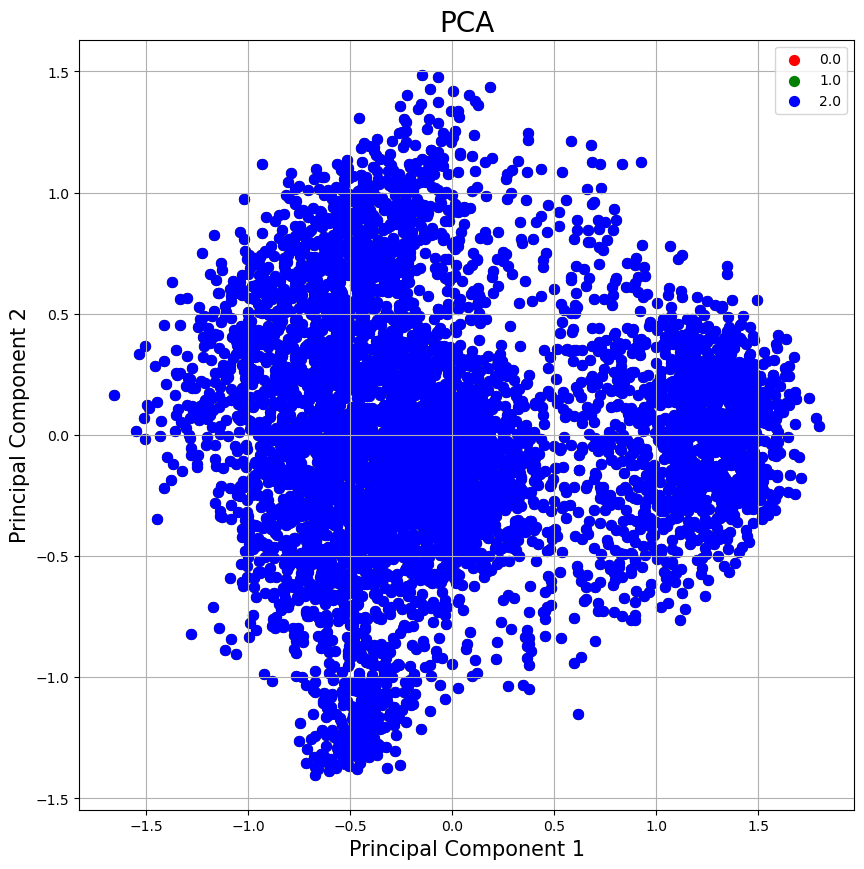

In [9]:
# Show the graphics.
fig = plt.figure(figsize = (10,10))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('Principal Component 1', fontsize = 15)
ax.set_ylabel('Principal Component 2', fontsize = 15)
ax.set_title('PCA', fontsize = 20)
targets = [0.0, 1.0, 2.0]
colors = ['r', 'g', 'b']
for target, color in zip(targets,colors):
    ax.scatter(finalDf['PC 1']
               , finalDf['PC 2']
               , c = color
               , s = 50)
ax.legend(targets)
ax.grid()

## Less data

In [10]:
data = pd.read_csv('../Data/SDSS-Gaia_5950stars.csv')

variables = data.columns
#print(variables.values)

no_var = [1,2,3,18,19,20]

input_variables = variables[no_var]
input_data      = data[input_variables]


np.savetxt('Clustering_AmalieDavidsen_KMeans_VariableList.csv',input_variables, fmt='%s')
np.savetxt('Clustering_AmalieDavidsen_DBSCAN_VariableList.csv',input_variables, fmt='%s')
np.savetxt('Clustering_AmalieDavidsen_TSNE_DBSCAN_VariableList.csv',input_variables, fmt='%s')
#Ceck data with info function
input_data.info()

from sklearn.preprocessing import quantile_transform
# data_X = data.drop(['target'], axis=1
# ) #We are not going to use the target for unsupervised learning
X_less = quantile_transform(input_data, copy=True)

from sklearn.decomposition import PCA
pca = PCA(n_components=2)
X_new_less = pca.fit_transform(X_less)

df_X_less = pd.DataFrame(data = X_new_less
             , columns = ['PC 1', 'PC 2'])
#df_y = pd.DataFrame(data = freq, columns = ['target'])

finalDf_less = df_X_less#pd.concat(df_X, axis = 1)
finalDf_less.head()

<class 'pandas.DataFrame'>
RangeIndex: 5950 entries, 0 to 5949
Data columns (total 6 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   J       5950 non-null   float64
 1   H       5950 non-null   float64
 2   K       5950 non-null   float64
 3   E       5950 non-null   float64
 4   Energy  5950 non-null   float64
 5   Lz      5950 non-null   float64
dtypes: float64(6)
memory usage: 279.0 KB


,PC 1,PC 2
0,0.411603,-0.173638
1,0.789318,0.077824
2,0.502390,-0.704745
3,0.656339,-0.541950
4,0.382936,-0.548078


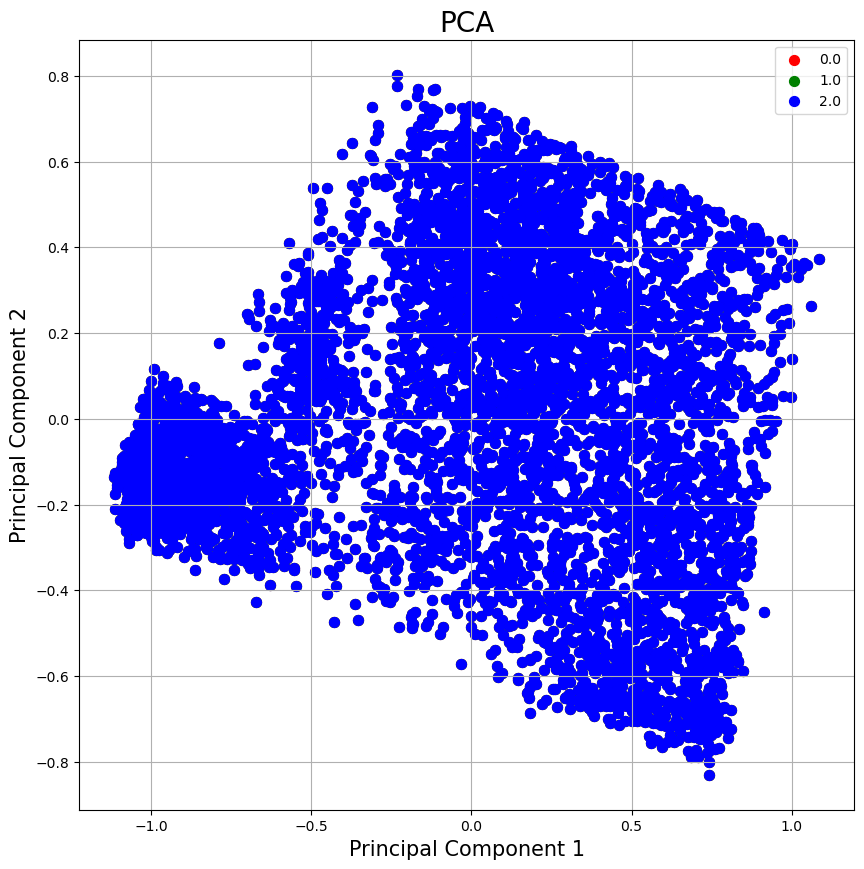

In [11]:
# Show the graphics.
fig = plt.figure(figsize = (10,10))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('Principal Component 1', fontsize = 15)
ax.set_ylabel('Principal Component 2', fontsize = 15)
ax.set_title('PCA', fontsize = 20)
targets = [0.0, 1.0, 2.0]
colors = ['r', 'g', 'b']
for target, color in zip(targets,colors):
    ax.scatter(finalDf_less['PC 1']
               , finalDf_less['PC 2']
               , c = color
               , s = 50)
ax.legend(targets)
ax.grid()

/Users/amaliedavidsen/Documents/uni_MSc/AML/AppliedML2026/.conda/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


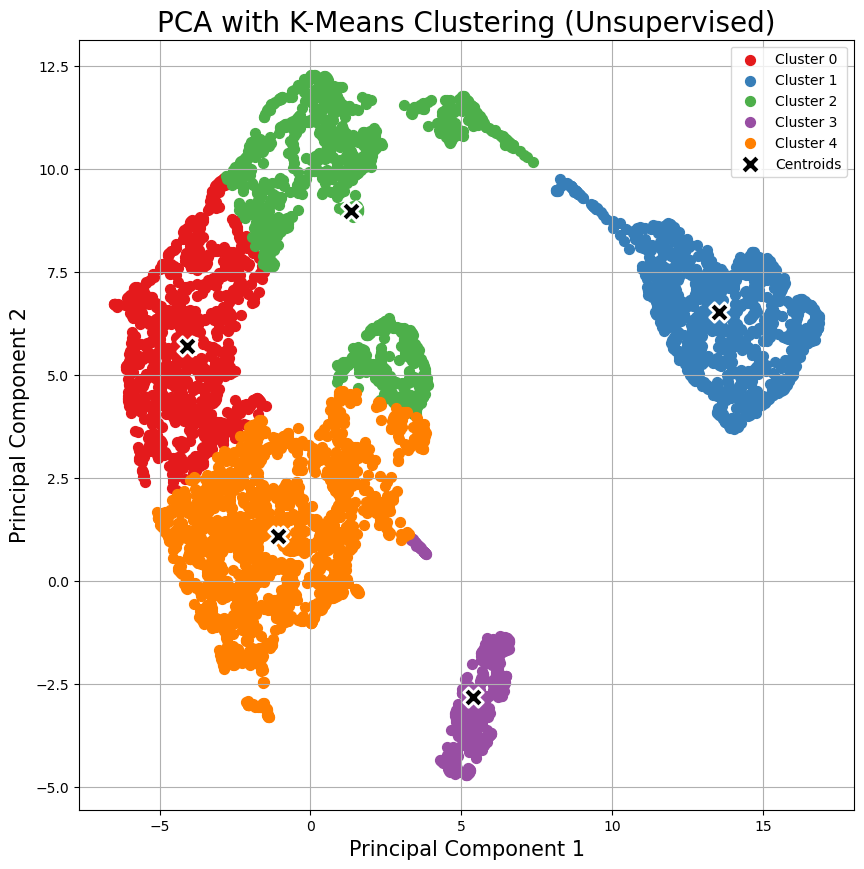

In [61]:
import umap 
from sklearn.cluster import KMeans
from matplotlib import cm
from sklearn.cluster import DBSCAN

map = umap.UMAP(n_components=2, n_neighbors=10, random_state=42)
X_new_less_umap = map.fit_transform(X_less)

df_X_less = pd.DataFrame(data = X_new_less_umap
             , columns = ['PC 1', 'PC 2'])
#df_y = pd.DataFrame(data = freq, columns = ['target'])

finalDf_less = df_X_less#pd.concat(df_X, axis = 1)
finalDf_less.head()

# Perform K-Means clustering
result = []
kmeans = KMeans(n_clusters=5, random_state=42)
finalDf_less['cluster'] = kmeans.fit_predict(finalDf_less[['PC 1', 'PC 2']])

# Create visualization
fig = plt.figure(figsize = (10,10))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('Principal Component 1', fontsize = 15)
ax.set_ylabel('Principal Component 2', fontsize = 15)
ax.set_title('PCA with K-Means Clustering (Unsupervised)', fontsize = 20)

# Use a colormap for automatic coloring
colors = cm.Set1(range(kmeans.n_clusters))
for cluster in range(kmeans.n_clusters):
    indicesToKeep = finalDf_less['cluster'] == cluster  # Filter by cluster
    ax.scatter(finalDf_less.loc[indicesToKeep, 'PC 1']
               , finalDf_less.loc[indicesToKeep, 'PC 2']
               , c=[colors[cluster]]
               , s=50
               , label=f'Cluster {cluster}')

# Plot cluster centers
centers = kmeans.cluster_centers_
ax.scatter(centers[:, 0], centers[:, 1], 
           c='black', marker='X', s=200, 
           edgecolors='white', linewidth=2,
           label='Centroids')

ax.legend()
ax.grid()
plt.show()
#np.savetxt('Clustering_AmalieDavidsen_KMEANS.csv',np.transpose([np.linspace(0,len(kmeans.labels_)-1, len(kmeans.labels_)), kmeans.labels_]), fmt='%d')
np.savetxt('Clustering_AmalieDavidsen_KMeans.csv',kmeans.labels_, fmt='%d')


Estimated number of clusters: 4
Estimated number of noise points: 0


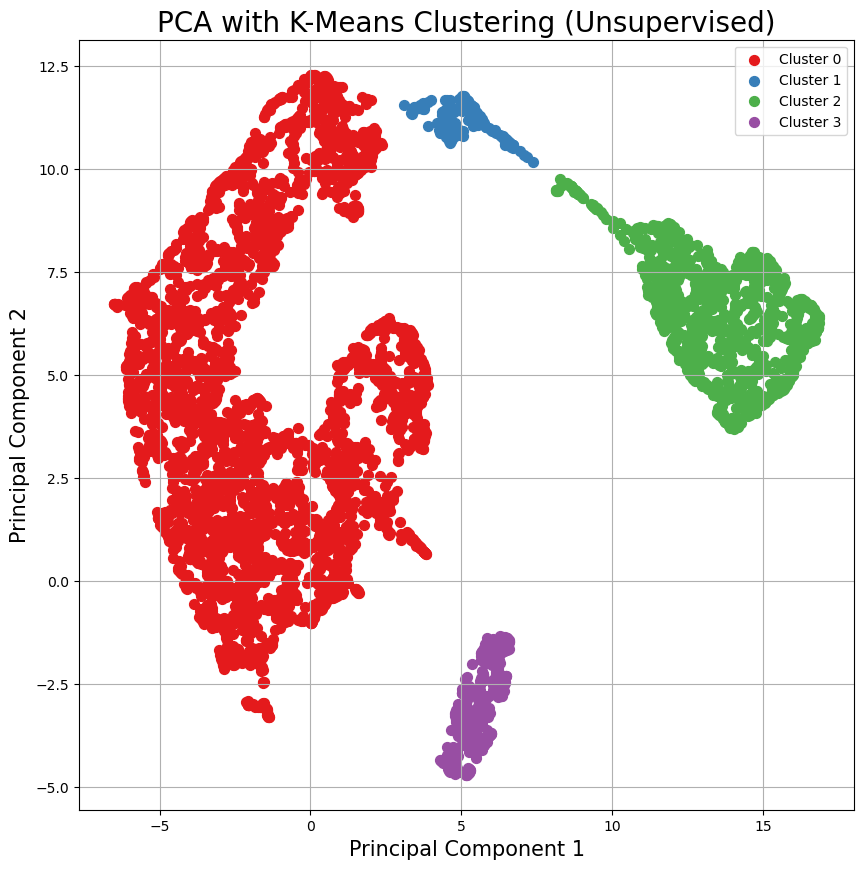

In [54]:


#db = DBSCAN(eps=0.1, min_samples=65).fit(X_new)

db = DBSCAN(eps=0.6, min_samples=10).fit(X_new_less_umap)
labels = db.labels_

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_noise_ = list(labels).count(-1)

print("Estimated number of clusters: %d" % n_clusters_)
print("Estimated number of noise points: %d" % n_noise_)


df_X_dbscan = pd.DataFrame(data = X_new_less_umap
             , columns = ['PC 1', 'PC 2'])

finalDf_less = df_X_dbscan
finalDf_less.head()


finalDf_less['cluster'] = db.fit_predict(finalDf_less[['PC 1', 'PC 2']])

# Create visualization
fig = plt.figure(figsize = (10,10))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('Principal Component 1', fontsize = 15)
ax.set_ylabel('Principal Component 2', fontsize = 15)
ax.set_title('PCA with K-Means Clustering (Unsupervised)', fontsize = 20)

# Use a colormap for automatic coloring
colors = cm.Set1(range(n_clusters_))
for cluster in range(n_clusters_):
    indicesToKeep = finalDf_less['cluster'] == cluster  # Filter by cluster
    ax.scatter(finalDf_less.loc[indicesToKeep, 'PC 1']
               , finalDf_less.loc[indicesToKeep, 'PC 2']
               , c=[colors[cluster]]
               , s=50
               , label=f'Cluster {cluster}')

ax.legend()
ax.grid()
plt.show()

np.savetxt('Clustering_AmalieDavidsen_DBSCAN.csv',labels, fmt='%d')

In [55]:
idxs = np.arange(input_data.shape[0])
idxs_rand = np.random.choice(idxs, size=5950)
df_cut = input_data.iloc[idxs_rand] # dataframe
X = input_data.iloc[idxs_rand].values # array

tsne = TSNE(n_components=2, init='random', method='barnes_hut', 
            random_state=42, perplexity=200, max_iter=500, verbose=2)
y_tsne = tsne.fit_transform(X)

[t-SNE] Computing 601 nearest neighbors...
[t-SNE] Indexed 5950 samples in 0.002s...
[t-SNE] Computed neighbors for 5950 samples in 0.355s...
[t-SNE] Computed conditional probabilities for sample 1000 / 5950
[t-SNE] Computed conditional probabilities for sample 2000 / 5950
[t-SNE] Computed conditional probabilities for sample 3000 / 5950
[t-SNE] Computed conditional probabilities for sample 4000 / 5950
[t-SNE] Computed conditional probabilities for sample 5000 / 5950
[t-SNE] Computed conditional probabilities for sample 5950 / 5950
[t-SNE] Mean sigma: 1761.037647
[t-SNE] Computed conditional probabilities in 0.675s
[t-SNE] Iteration 50: error = 62.2401352, gradient norm = 0.0833560 (50 iterations in 1.034s)
[t-SNE] Iteration 100: error = 50.3457794, gradient norm = 0.0092183 (50 iterations in 0.931s)
[t-SNE] Iteration 150: error = 48.7473335, gradient norm = 0.0041002 (50 iterations in 0.839s)
[t-SNE] Iteration 200: error = 48.2392349, gradient norm = 0.0028342 (50 iterations in 0.846s

Estimated number of clusters: 4
Estimated number of noise points: 5534


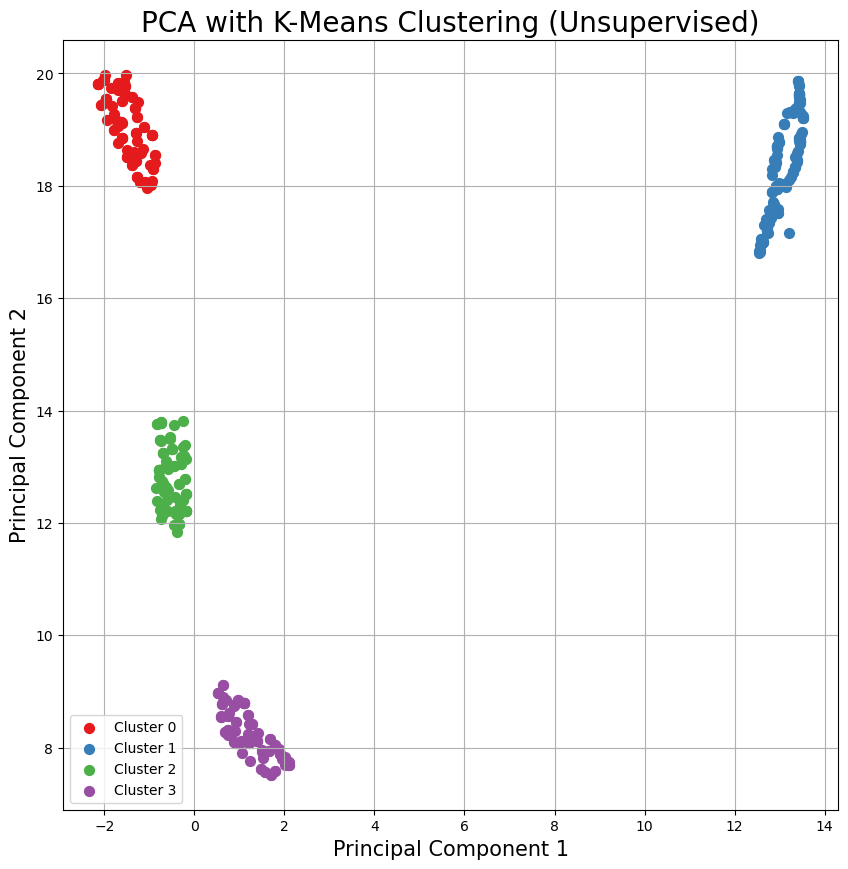

5950


In [60]:


#db = DBSCAN(eps=0.1, min_samples=65).fit(X_new)
# db = DBSCAN(eps=0.9, min_samples=72).fit(y_tsne)
db = DBSCAN(eps=0.9, min_samples=75).fit(y_tsne)
labels = db.labels_

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_noise_ = list(labels).count(-1)

print("Estimated number of clusters: %d" % n_clusters_)
print("Estimated number of noise points: %d" % n_noise_)


df_X_dbscan = pd.DataFrame(data = y_tsne
             , columns = ['PC 1', 'PC 2'])

finalDf_less = df_X_dbscan
finalDf_less.head()


finalDf_less['cluster'] = db.fit_predict(finalDf_less[['PC 1', 'PC 2']])

# Create visualization
fig = plt.figure(figsize = (10,10))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('Principal Component 1', fontsize = 15)
ax.set_ylabel('Principal Component 2', fontsize = 15)
ax.set_title('PCA with K-Means Clustering (Unsupervised)', fontsize = 20)

# Use a colormap for automatic coloring
colors = cm.Set1(range(n_clusters_))
for cluster in range(n_clusters_):
    indicesToKeep = finalDf_less['cluster'] == cluster  # Filter by cluster
    ax.scatter(finalDf_less.loc[indicesToKeep, 'PC 1']
               , finalDf_less.loc[indicesToKeep, 'PC 2']
               , c=[colors[cluster]]
               , s=50
               , label=f'Cluster {cluster}')

ax.legend()
ax.grid()
plt.show()
print(len(labels))

np.savetxt('Clustering_AmalieDavidsen_TSNE_DBSCAN.csv',labels, fmt='%d')

Estimated number of clusters: 2
Estimated number of noise points: 0


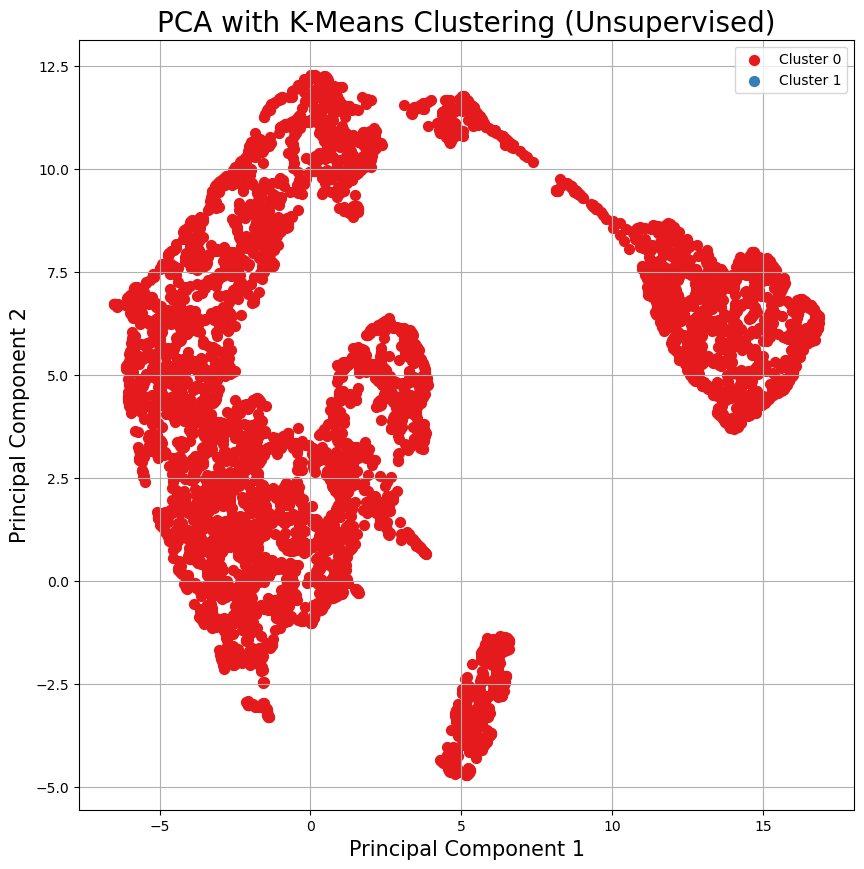

In [16]:
from sklearn import cluster, datasets, mixture
optics = cluster.OPTICS(
        min_samples=40,
        xi=0.5,
        min_cluster_size=30,)


X_new_less_umap = map.fit_transform(X_less)

df_X_less = pd.DataFrame(data = X_new_less_umap
             , columns = ['PC 1', 'PC 2'])

finalDf_less = df_X_less#pd.concat(df_X, axis = 1)
finalDf_less.head()

labels = optics.fit_predict(finalDf_less[['PC 1', 'PC 2']])

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_noise_ = list(labels).count(-1)

print("Estimated number of clusters: %d" % n_clusters_)

print("Estimated number of noise points: %d" % n_noise_)




df_X_dbscan = pd.DataFrame(data = X_new
             , columns = ['PC 1', 'PC 2'])

finalDf_dbscan = df_X_dbscan
finalDf_dbscan.head()


finalDf_less['cluster'] = optics.fit_predict(finalDf_dbscan[['PC 1', 'PC 2']])

# Create visualization
fig = plt.figure(figsize = (10,10))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('Principal Component 1', fontsize = 15)
ax.set_ylabel('Principal Component 2', fontsize = 15)
ax.set_title('PCA with K-Means Clustering (Unsupervised)', fontsize = 20)

# Use a colormap for automatic coloring
colors = cm.Set1(range(n_clusters_))
for cluster in range(n_clusters_):
    indicesToKeep = finalDf_less['cluster'] == cluster  # Filter by cluster
    ax.scatter(finalDf_less.loc[indicesToKeep, 'PC 1']
               , finalDf_less.loc[indicesToKeep, 'PC 2']
               , c=[colors[cluster]]
               , s=50
               , label=f'Cluster {cluster}')

ax.legend()
ax.grid()
plt.show()

/Users/amaliedavidsen/Documents/uni_MSc/AML/AppliedML2026/.conda/lib/python3.11/site-packages/sklearn/manifold/_spectral_embedding.py:324: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


Estimated number of clusters: 4
Estimated number of noise points: 0


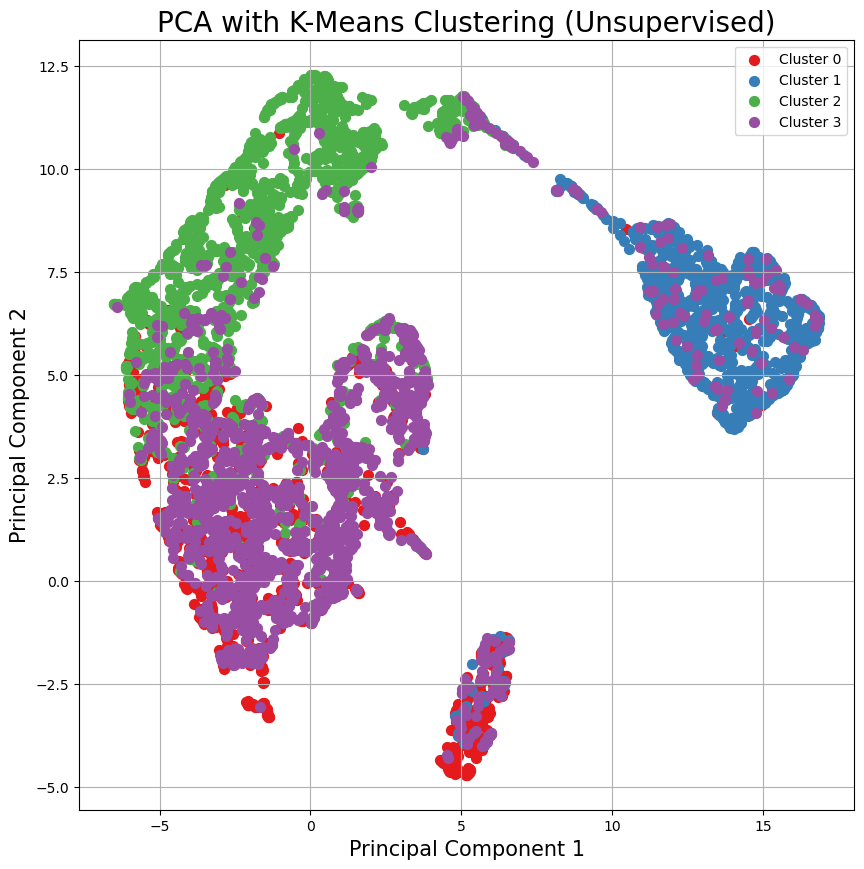

In [ ]:
from sklearn import cluster, datasets, mixture
spectral = cluster.SpectralClustering(
        n_clusters=4,
        eigen_solver="arpack",
        affinity="nearest_neighbors",
        random_state=42,
    )

X_new_less_umap = map.fit_transform(X_less)

df_X_less = pd.DataFrame(data = X_new_less_umap
             , columns = ['PC 1', 'PC 2'])
#df_y = pd.DataFrame(data = freq, columns = ['target'])

finalDf_less = df_X_less#pd.concat(df_X, axis = 1)
finalDf_less.head()

labels = spectral.fit_predict(finalDf_less[['PC 1', 'PC 2']])

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_noise_ = list(labels).count(-1)

print("Estimated number of clusters: %d" % n_clusters_)
print("Estimated number of noise points: %d" % n_noise_)


df_X_dbscan = pd.DataFrame(data = X_new
             , columns = ['PC 1', 'PC 2'])

finalDf_dbscan = df_X_dbscan
finalDf_dbscan.head()


finalDf_less['cluster'] = spectral.fit_predict(finalDf_dbscan[['PC 1', 'PC 2']])

# Create visualization
fig = plt.figure(figsize = (10,10))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('Principal Component 1', fontsize = 15)
ax.set_ylabel('Principal Component 2', fontsize = 15)
ax.set_title('PCA with K-Means Clustering (Unsupervised)', fontsize = 20)

# Use a colormap for automatic coloring
colors = cm.Set1(range(n_clusters_))
for cluster in range(n_clusters_):
    indicesToKeep = finalDf_less['cluster'] == cluster  # Filter by cluster
    ax.scatter(finalDf_less.loc[indicesToKeep, 'PC 1']
               , finalDf_less.loc[indicesToKeep, 'PC 2']
               , c=[colors[cluster]]
               , s=50
               , label=f'Cluster {cluster}')

ax.legend()
ax.grid()
plt.show()

np.savetxt('Clustering_AmalieDavidsen_SpectralClustering.csv',labels, fmt='%d')

Estimated number of clusters: 4
Estimated number of noise points: 0


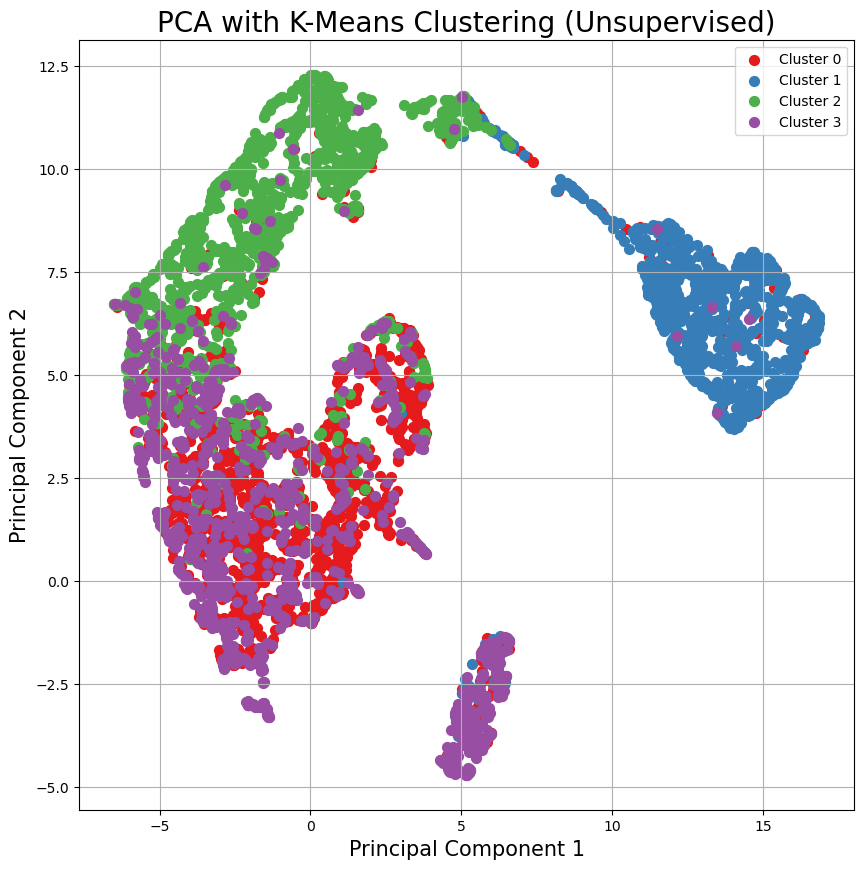

In [18]:
from sklearn import cluster, datasets, mixture

gmm = mixture.GaussianMixture(
        n_components=4,
        covariance_type="full",
        random_state=42,
    )

X_new_less_umap = map.fit_transform(X_less)

df_X_less = pd.DataFrame(data = X_new_less_umap
             , columns = ['PC 1', 'PC 2'])
#df_y = pd.DataFrame(data = freq, columns = ['target'])

finalDf_less = df_X_less#pd.concat(df_X, axis = 1)
finalDf_less.head()

labels = gmm.fit_predict(finalDf_less[['PC 1', 'PC 2']])

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_noise_ = list(labels).count(-1)

print("Estimated number of clusters: %d" % n_clusters_)
print("Estimated number of noise points: %d" % n_noise_)


df_X_dbscan = pd.DataFrame(data = X_new
             , columns = ['PC 1', 'PC 2'])

finalDf_dbscan = df_X_dbscan
finalDf_dbscan.head()


finalDf_less['cluster'] = gmm.fit_predict(finalDf_dbscan[['PC 1', 'PC 2']])

# Create visualization
fig = plt.figure(figsize = (10,10))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('Principal Component 1', fontsize = 15)
ax.set_ylabel('Principal Component 2', fontsize = 15)
ax.set_title('PCA with K-Means Clustering (Unsupervised)', fontsize = 20)

# Use a colormap for automatic coloring
colors = cm.Set1(range(n_clusters_))
for cluster in range(n_clusters_):
    indicesToKeep = finalDf_less['cluster'] == cluster  # Filter by cluster
    ax.scatter(finalDf_less.loc[indicesToKeep, 'PC 1']
               , finalDf_less.loc[indicesToKeep, 'PC 2']
               , c=[colors[cluster]]
               , s=50
               , label=f'Cluster {cluster}')

ax.legend()
ax.grid()
plt.show()

np.savetxt('Clustering_AmalieDavidsen_SpectralClustering.csv',labels, fmt='%d')